# Course Project - Real-World Machine Learning Model

#### Installing important libraries

In [1]:
!pip install pandas-profiling numpy matplotlib seaborn plotly --quiet

In [2]:
!pip install opendatasets scikit-learn jovian --quiet --upgrade

#### Setting up Graphs for Visualisation

In [3]:
import opendatasets as od
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib
import jovian
import os
%matplotlib inline

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 150)
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

#### Downloading Dataset from Kaggle

In [4]:
od.download('https://www.kaggle.com/c/DontGetKicked')

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: winchestera1967
Your Kaggle Key: ········


100%|██████████| 10.2M/10.2M [00:00<00:00, 42.7MB/s]



Extracting archive ./DontGetKicked/DontGetKicked.zip to ./DontGetKicked


In [5]:
os.listdir('DontGetKicked')

['test.csv',
 'test.zip',
 'example_entry.csv',
 'Carvana_Data_Dictionary.txt',
 'training.csv',
 'training.zip']

In [6]:
test_df = pd.read_csv('./DontGetKicked/test.csv')
train_df = pd.read_csv('./DontGetKicked/training.csv')
example_entry_df = pd.read_csv('./DontGetKicked/example_entry.csv')

In [7]:
test_df

,RefId,PurchDate,Auction,VehYear,VehicleAge,Make,Model,Trim,SubModel,Color,Transmission,WheelTypeID,WheelType,VehOdo,Nationality,Size,TopThreeAmericanName,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,PRIMEUNIT,AUCGUART,BYRNO,VNZIP1,VNST,VehBCost,IsOnlineSale,WarrantyCost
0,73015,12/2/2009,ADESA,2005,4,PONTIAC,GRAND PRIX,Bas,4D SEDAN,SILVER,AUTO,1.0,Alloy,85377,AMERICAN,LARGE,GM,5032.0,6386.0,5935.0,7397.0,4905.0,6181.0,8557.0,9752.0,NaN,NaN,18881,30212,GA,6500.0,0,2152
1,73016,12/2/2009,ADESA,2005,4,CHEVROLET,MALIBU V6,LS,4D SEDAN LS,SILVER,AUTO,1.0,Alloy,61873,AMERICAN,MEDIUM,GM,4502.0,5685.0,5362.0,6640.0,4645.0,5710.0,7562.0,9296.0,NaN,NaN,18111,30212,GA,6300.0,0,1118
2,73017,12/2/2009,ADESA,2006,3,DODGE,DURANGO 2WD V8,Adv,4D SUV 4.7L ADVENTURER,SILVER,AUTO,1.0,Alloy,69283,AMERICAN,MEDIUM SUV,CHRYSLER,10244.0,13041.0,11564.0,14584.0,10883.0,12166.0,15340.0,16512.0,NaN,NaN,18111,30212,GA,9700.0,0,1215
3,73018,12/2/2009,ADESA,2002,7,SATURN,L SERIES,L20,4D SEDAN L200,GOLD,AUTO,1.0,Alloy,87889,AMERICAN,MEDIUM,GM,2558.0,3542.0,3263.0,4325.0,2928.0,3607.0,5725.0,6398.0,NaN,NaN,18881,30212,GA,4150.0,0,1933
4,73019,12/2/2009,ADESA,2007,2,HYUNDAI,ACCENT,GS,2D COUPE GS,BLUE,AUTO,NaN,NaN,73432,OTHER ASIAN,COMPACT,OTHER,5013.0,6343.0,5914.0,7350.0,5013.0,6343.0,5914.0,7350.0,NaN,NaN,18111,30212,GA,4100.0,0,920
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48702,121742,11/17/2010,MANHEIM,2005,5,FORD,FIVE HUNDRED,SEL,4D SEDAN SEL,BLACK,AUTO,1.0,Alloy,88645,AMERICAN,LARGE,FORD,5358.0,6836.0,8987.0,10905.0,5761.0,6965.0,9764.0,11395.0,NaN,NaN,20928,33411,FL,7955.0,0,1633
48703,121743,11/17/2010,MANHEIM,2007,3,TOYOTA,COROLLA,CE,4D SEDAN CE,GREEN,AUTO,2.0,Covers,81862,TOP LINE ASIAN,COMPACT,OTHER,6849.0,7992.0,10999.0,12021.0,6856.0,8183.0,10283.0,11565.0,NaN,NaN,20928,33411,FL,7035.0,0,594
48704,121744,11/17/2010,MANHEIM,2006,4,KIA,SPECTRA,EX,4D SEDAN EX,BLACK,AUTO,2.0,Covers,82451,OTHER ASIAN,MEDIUM,OTHER,4662.0,5655.0,7972.0,9670.0,4833.0,5856.0,7871.0,9490.0,NO,GREEN,20928,33411,FL,6335.0,0,594
48705,121745,11/17/2010,MANHEIM,2005,5,MAZDA,MAZDA3,s,4D SEDAN GT,SILVER,AUTO,1.0,Alloy,75760,OTHER ASIAN,MEDIUM,OTHER,5953.0,8166.0,9137.0,11949.0,5092.0,6853.0,8576.0,9937.0,NO,GREEN,20928,33411,FL,8055.0,0,1038


##### This is test dataset of shape (48707x33). We will test our model on this dataset

In [8]:
train_df

,RefId,IsBadBuy,PurchDate,Auction,VehYear,VehicleAge,Make,Model,Trim,SubModel,Color,Transmission,WheelTypeID,WheelType,VehOdo,Nationality,Size,TopThreeAmericanName,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,PRIMEUNIT,AUCGUART,BYRNO,VNZIP1,VNST,VehBCost,IsOnlineSale,WarrantyCost
0,1,0,12/7/2009,ADESA,2006,3,MAZDA,MAZDA3,i,4D SEDAN I,RED,AUTO,1.0,Alloy,89046,OTHER ASIAN,MEDIUM,OTHER,8155.0,9829.0,11636.0,13600.0,7451.0,8552.0,11597.0,12409.0,NaN,NaN,21973,33619,FL,7100.0,0,1113
1,2,0,12/7/2009,ADESA,2004,5,DODGE,1500 RAM PICKUP 2WD,ST,QUAD CAB 4.7L SLT,WHITE,AUTO,1.0,Alloy,93593,AMERICAN,LARGE TRUCK,CHRYSLER,6854.0,8383.0,10897.0,12572.0,7456.0,9222.0,11374.0,12791.0,NaN,NaN,19638,33619,FL,7600.0,0,1053
2,3,0,12/7/2009,ADESA,2005,4,DODGE,STRATUS V6,SXT,4D SEDAN SXT FFV,MAROON,AUTO,2.0,Covers,73807,AMERICAN,MEDIUM,CHRYSLER,3202.0,4760.0,6943.0,8457.0,4035.0,5557.0,7146.0,8702.0,NaN,NaN,19638,33619,FL,4900.0,0,1389
3,4,0,12/7/2009,ADESA,2004,5,DODGE,NEON,SXT,4D SEDAN,SILVER,AUTO,1.0,Alloy,65617,AMERICAN,COMPACT,CHRYSLER,1893.0,2675.0,4658.0,5690.0,1844.0,2646.0,4375.0,5518.0,NaN,NaN,19638,33619,FL,4100.0,0,630
4,5,0,12/7/2009,ADESA,2005,4,FORD,FOCUS,ZX3,2D COUPE ZX3,SILVER,MANUAL,2.0,Covers,69367,AMERICAN,COMPACT,FORD,3913.0,5054.0,7723.0,8707.0,3247.0,4384.0,6739.0,7911.0,NaN,NaN,19638,33619,FL,4000.0,0,1020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72978,73010,1,12/2/2009,ADESA,2001,8,MERCURY,SABLE,GS,4D SEDAN GS,BLACK,AUTO,1.0,Alloy,45234,AMERICAN,MEDIUM,FORD,1996.0,2993.0,2656.0,3732.0,2190.0,3055.0,4836.0,5937.0,NaN,NaN,18111,30212,GA,4200.0,0,993
72979,73011,0,12/2/2009,ADESA,2007,2,CHEVROLET,MALIBU 4C,LS,4D SEDAN LS,SILVER,AUTO,NaN,NaN,71759,AMERICAN,MEDIUM,GM,6418.0,7325.0,7431.0,8411.0,6785.0,8132.0,10151.0,11652.0,NaN,NaN,18881,30212,GA,6200.0,0,1038
72980,73012,0,12/2/2009,ADESA,2005,4,JEEP,GRAND CHEROKEE 2WD V,Lar,4D WAGON LAREDO,SILVER,AUTO,1.0,Alloy,88500,AMERICAN,MEDIUM SUV,CHRYSLER,8545.0,9959.0,9729.0,11256.0,8375.0,9802.0,11831.0,14402.0,NaN,NaN,18111,30212,GA,8200.0,0,1893
72981,73013,0,12/2/2009,ADESA,2006,3,CHEVROLET,IMPALA,LS,4D SEDAN LS,WHITE,AUTO,1.0,Alloy,79554,AMERICAN,LARGE,GM,6420.0,7604.0,7434.0,8712.0,6590.0,7684.0,10099.0,11228.0,NaN,NaN,18881,30212,GA,7000.0,0,1974


##### This is training dataset on which we will train our model

In [9]:
example_entry_df

,RefId,IsBadBuy
0,73015,0
1,73016,0
2,73017,0
3,73018,0
4,73019,0
...,...,...
48702,121742,0
48703,121743,0
48704,121744,0
48705,121745,0


##### Lets save our work so that we don't lose any progress

In [10]:
jovian.commit()

<IPython.core.display.Javascript object>

[jovian] Updating notebook "aditya-win-official/dontgetkicked" on https://jovian.ai
[jovian] Committed successfully! https://jovian.ai/aditya-win-official/dontgetkicked


'https://jovian.ai/aditya-win-official/dontgetkicked'

### Exploratory Data Analysis

In [11]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72983 entries, 0 to 72982
Data columns (total 34 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   RefId                              72983 non-null  int64  
 1   IsBadBuy                           72983 non-null  int64  
 2   PurchDate                          72983 non-null  object 
 3   Auction                            72983 non-null  object 
 4   VehYear                            72983 non-null  int64  
 5   VehicleAge                         72983 non-null  int64  
 6   Make                               72983 non-null  object 
 7   Model                              72983 non-null  object 
 8   Trim                               70623 non-null  object 
 9   SubModel                           72975 non-null  object 
 10  Color                              72975 non-null  object 
 11  Transmission                       72974 non-null  obj

In [12]:
train_df.isnull().sum()

RefId                                    0
IsBadBuy                                 0
PurchDate                                0
Auction                                  0
VehYear                                  0
VehicleAge                               0
Make                                     0
Model                                    0
Trim                                  2360
SubModel                                 8
Color                                    8
Transmission                             9
WheelTypeID                           3169
WheelType                             3174
VehOdo                                   0
Nationality                              5
Size                                     5
TopThreeAmericanName                     5
MMRAcquisitionAuctionAveragePrice       18
MMRAcquisitionAuctionCleanPrice         18
MMRAcquisitionRetailAveragePrice        18
MMRAcquisitonRetailCleanPrice           18
MMRCurrentAuctionAveragePrice          315
MMRCurrentA

In [13]:
train_df['IsBadBuy'].value_counts() 

0    64007
1     8976
Name: IsBadBuy, dtype: int64

In [14]:
train_df['VehYear'].value_counts()

2006    17043
2005    15489
2007    11423
2004    10207
2008     6885
2003     6227
2002     3405
2001     1481
2009      822
2010        1
Name: VehYear, dtype: int64

In [15]:
train_df['Model'].value_counts()

PT CRUISER              2329
IMPALA                  1990
TAURUS                  1425
CALIBER                 1375
CARAVAN GRAND FWD V6    1289
                        ... 
ESCAPE                     1
PRIZM 1.8L I-4 SFI D       1
CAMRY V6 3.0L / 3.3L       1
LHS                        1
PATRIOT 2WD 4C 2.0L        1
Name: Model, Length: 1063, dtype: int64

In [16]:
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

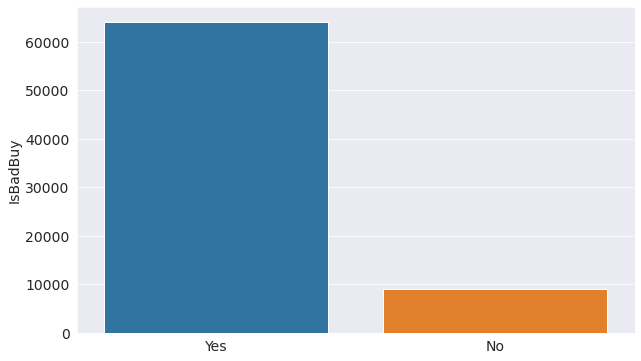

In [17]:
sns.barplot(x= ['Yes', 'No'], y = train_df['IsBadBuy'].value_counts());

The above plot says that there are more number of bad buys than good buys

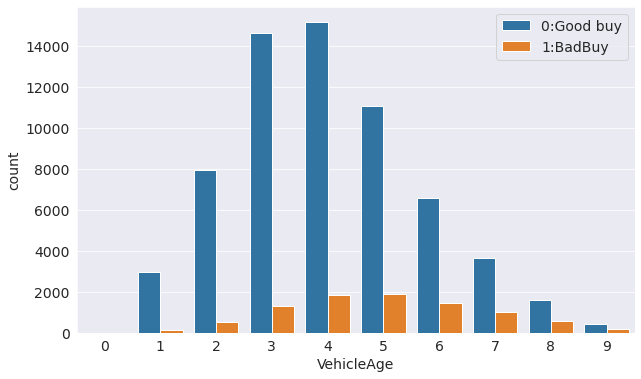

In [18]:
sns.countplot(x = "VehicleAge", data =train_df, hue = "IsBadBuy")
plt.legend(['0:Good buy','1:BadBuy'])
plt.show()

The above plot says that, on an average, vehicles with mean age of 4 and 5 are more in number of bad buys.

In [19]:
px.histogram(train_df, x = "Make", color = "IsBadBuy",height=500,width=800)

From the above plot we can say that Chevrolet produces more number of bad buys car

In [20]:
px.histogram(train_df, x = "Nationality", color = "IsBadBuy",height=450,width=800)

From the above graph we can say that, America has lot of cars that are not a good buy

In [21]:
px.scatter(train_df, x = 'MMRAcquisitionAuctionAveragePrice', y = 'MMRAcquisitionRetailAveragePrice', color = 'IsBadBuy')

In [22]:
px.scatter(train_df, x = 'MMRAcquisitionAuctionAveragePrice', y = 'MMRCurrentAuctionAveragePrice' ,color = 'IsBadBuy')

In [23]:
train_df['Transmission'] = train_df["Transmission"].replace("Manual", "MANUAL")
total = train_df.Transmission.value_counts()
total

AUTO      70398
MANUAL     2576
Name: Transmission, dtype: int64

In [24]:
auto_df = train_df[(train_df.Transmission == 'AUTO') & train_df.IsBadBuy == 1].count()[1]
manual_df = train_df[(train_df.Transmission == 'MANUAL') & train_df.IsBadBuy == 1].count()[1]

In [25]:
print("Probability of Bad Buys depending on Transmission")
print("Auto: ", auto_df/total[0])
print("Manual: ", manual_df/total[1])

Probability of Bad Buys depending on Transmission
Auto:  0.12324213756072616
Manual:  0.11607142857142858


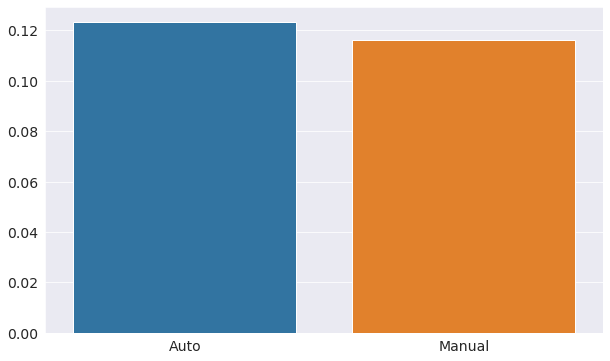

In [26]:
sns.barplot(x = ["Auto", "Manual"], y = [auto_df/total[0], manual_df/total[1]]);

### Feature Engineering

In [27]:
train_df.drop(['RefId','BYRNO','VNZIP1','PurchDate'],axis=1,inplace=True)
test_df.drop(['RefId','BYRNO','VNZIP1','PurchDate'],axis=1,inplace=True)

We dropped ['RefId','BYRNO','VNZIP1','PurchDate'] columns from both our dataset, as these are not useful columns

In [28]:
train_df.Transmission.value_counts(dropna=False)
train_df["Transmission"].replace("Manual","MANUAL",inplace=True)
train_df.Transmission.value_counts(dropna=False)

AUTO      70398
MANUAL     2576
NaN           9
Name: Transmission, dtype: int64

In [29]:
train_df.WheelType.value_counts(dropna=False)

Alloy      36050
Covers     33004
NaN         3174
Special      755
Name: WheelType, dtype: int64

In [30]:
train_df.WheelTypeID.value_counts(dropna=False)

1.0    36050
2.0    33004
NaN     3169
3.0      755
0.0        5
Name: WheelTypeID, dtype: int64

In [31]:
train_df.drop(['Model','Trim','SubModel','VehYear','WheelTypeID','VNST'],axis=1,inplace=True)
test_df.drop(['Model','Trim','SubModel','VehYear','WheelTypeID','VNST'],axis=1,inplace=True)

We can drop Model, Trim and SubModel as they have alot of categories and model wont be able to learn all of them.
WheelType and WheelTypeID are one and the same. One of them is containing numeric categories and other as string. Its better we drop WheelTypeID as the other column has type of metal used for making the wheel which might help us understand the importance of a particular metal used in making the wheel
VehYear might not play a crucial role as we have VehicleAge as a column. The PurchDate varies and similarly VehYear varies.The only thing that matters is how much old the vehicle is at the time of resale. Thus drop VehYear
State from which car is bought should nit be a factor for judging bad buy . Thus we can drop VNST

So the final dataframes are

In [32]:
train_df

,IsBadBuy,Auction,VehicleAge,Make,Color,Transmission,WheelType,VehOdo,Nationality,Size,TopThreeAmericanName,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,PRIMEUNIT,AUCGUART,VehBCost,IsOnlineSale,WarrantyCost
0,0,ADESA,3,MAZDA,RED,AUTO,Alloy,89046,OTHER ASIAN,MEDIUM,OTHER,8155.0,9829.0,11636.0,13600.0,7451.0,8552.0,11597.0,12409.0,NaN,NaN,7100.0,0,1113
1,0,ADESA,5,DODGE,WHITE,AUTO,Alloy,93593,AMERICAN,LARGE TRUCK,CHRYSLER,6854.0,8383.0,10897.0,12572.0,7456.0,9222.0,11374.0,12791.0,NaN,NaN,7600.0,0,1053
2,0,ADESA,4,DODGE,MAROON,AUTO,Covers,73807,AMERICAN,MEDIUM,CHRYSLER,3202.0,4760.0,6943.0,8457.0,4035.0,5557.0,7146.0,8702.0,NaN,NaN,4900.0,0,1389
3,0,ADESA,5,DODGE,SILVER,AUTO,Alloy,65617,AMERICAN,COMPACT,CHRYSLER,1893.0,2675.0,4658.0,5690.0,1844.0,2646.0,4375.0,5518.0,NaN,NaN,4100.0,0,630
4,0,ADESA,4,FORD,SILVER,MANUAL,Covers,69367,AMERICAN,COMPACT,FORD,3913.0,5054.0,7723.0,8707.0,3247.0,4384.0,6739.0,7911.0,NaN,NaN,4000.0,0,1020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72978,1,ADESA,8,MERCURY,BLACK,AUTO,Alloy,45234,AMERICAN,MEDIUM,FORD,1996.0,2993.0,2656.0,3732.0,2190.0,3055.0,4836.0,5937.0,NaN,NaN,4200.0,0,993
72979,0,ADESA,2,CHEVROLET,SILVER,AUTO,NaN,71759,AMERICAN,MEDIUM,GM,6418.0,7325.0,7431.0,8411.0,6785.0,8132.0,10151.0,11652.0,NaN,NaN,6200.0,0,1038
72980,0,ADESA,4,JEEP,SILVER,AUTO,Alloy,88500,AMERICAN,MEDIUM SUV,CHRYSLER,8545.0,9959.0,9729.0,11256.0,8375.0,9802.0,11831.0,14402.0,NaN,NaN,8200.0,0,1893
72981,0,ADESA,3,CHEVROLET,WHITE,AUTO,Alloy,79554,AMERICAN,LARGE,GM,6420.0,7604.0,7434.0,8712.0,6590.0,7684.0,10099.0,11228.0,NaN,NaN,7000.0,0,1974


In [33]:
test_df

,Auction,VehicleAge,Make,Color,Transmission,WheelType,VehOdo,Nationality,Size,TopThreeAmericanName,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,PRIMEUNIT,AUCGUART,VehBCost,IsOnlineSale,WarrantyCost
0,ADESA,4,PONTIAC,SILVER,AUTO,Alloy,85377,AMERICAN,LARGE,GM,5032.0,6386.0,5935.0,7397.0,4905.0,6181.0,8557.0,9752.0,NaN,NaN,6500.0,0,2152
1,ADESA,4,CHEVROLET,SILVER,AUTO,Alloy,61873,AMERICAN,MEDIUM,GM,4502.0,5685.0,5362.0,6640.0,4645.0,5710.0,7562.0,9296.0,NaN,NaN,6300.0,0,1118
2,ADESA,3,DODGE,SILVER,AUTO,Alloy,69283,AMERICAN,MEDIUM SUV,CHRYSLER,10244.0,13041.0,11564.0,14584.0,10883.0,12166.0,15340.0,16512.0,NaN,NaN,9700.0,0,1215
3,ADESA,7,SATURN,GOLD,AUTO,Alloy,87889,AMERICAN,MEDIUM,GM,2558.0,3542.0,3263.0,4325.0,2928.0,3607.0,5725.0,6398.0,NaN,NaN,4150.0,0,1933
4,ADESA,2,HYUNDAI,BLUE,AUTO,NaN,73432,OTHER ASIAN,COMPACT,OTHER,5013.0,6343.0,5914.0,7350.0,5013.0,6343.0,5914.0,7350.0,NaN,NaN,4100.0,0,920
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48702,MANHEIM,5,FORD,BLACK,AUTO,Alloy,88645,AMERICAN,LARGE,FORD,5358.0,6836.0,8987.0,10905.0,5761.0,6965.0,9764.0,11395.0,NaN,NaN,7955.0,0,1633
48703,MANHEIM,3,TOYOTA,GREEN,AUTO,Covers,81862,TOP LINE ASIAN,COMPACT,OTHER,6849.0,7992.0,10999.0,12021.0,6856.0,8183.0,10283.0,11565.0,NaN,NaN,7035.0,0,594
48704,MANHEIM,4,KIA,BLACK,AUTO,Covers,82451,OTHER ASIAN,MEDIUM,OTHER,4662.0,5655.0,7972.0,9670.0,4833.0,5856.0,7871.0,9490.0,NO,GREEN,6335.0,0,594
48705,MANHEIM,5,MAZDA,SILVER,AUTO,Alloy,75760,OTHER ASIAN,MEDIUM,OTHER,5953.0,8166.0,9137.0,11949.0,5092.0,6853.0,8576.0,9937.0,NO,GREEN,8055.0,0,1038


In [34]:
targets = train_df['IsBadBuy']

In [35]:
train_df.drop('IsBadBuy', axis= 1, inplace=True)

In [36]:
targets

0        0
1        0
2        0
3        0
4        0
        ..
72978    1
72979    0
72980    0
72981    0
72982    0
Name: IsBadBuy, Length: 72983, dtype: int64

We extract our target column.

In [37]:
train_df

,Auction,VehicleAge,Make,Color,Transmission,WheelType,VehOdo,Nationality,Size,TopThreeAmericanName,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,PRIMEUNIT,AUCGUART,VehBCost,IsOnlineSale,WarrantyCost
0,ADESA,3,MAZDA,RED,AUTO,Alloy,89046,OTHER ASIAN,MEDIUM,OTHER,8155.0,9829.0,11636.0,13600.0,7451.0,8552.0,11597.0,12409.0,NaN,NaN,7100.0,0,1113
1,ADESA,5,DODGE,WHITE,AUTO,Alloy,93593,AMERICAN,LARGE TRUCK,CHRYSLER,6854.0,8383.0,10897.0,12572.0,7456.0,9222.0,11374.0,12791.0,NaN,NaN,7600.0,0,1053
2,ADESA,4,DODGE,MAROON,AUTO,Covers,73807,AMERICAN,MEDIUM,CHRYSLER,3202.0,4760.0,6943.0,8457.0,4035.0,5557.0,7146.0,8702.0,NaN,NaN,4900.0,0,1389
3,ADESA,5,DODGE,SILVER,AUTO,Alloy,65617,AMERICAN,COMPACT,CHRYSLER,1893.0,2675.0,4658.0,5690.0,1844.0,2646.0,4375.0,5518.0,NaN,NaN,4100.0,0,630
4,ADESA,4,FORD,SILVER,MANUAL,Covers,69367,AMERICAN,COMPACT,FORD,3913.0,5054.0,7723.0,8707.0,3247.0,4384.0,6739.0,7911.0,NaN,NaN,4000.0,0,1020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72978,ADESA,8,MERCURY,BLACK,AUTO,Alloy,45234,AMERICAN,MEDIUM,FORD,1996.0,2993.0,2656.0,3732.0,2190.0,3055.0,4836.0,5937.0,NaN,NaN,4200.0,0,993
72979,ADESA,2,CHEVROLET,SILVER,AUTO,NaN,71759,AMERICAN,MEDIUM,GM,6418.0,7325.0,7431.0,8411.0,6785.0,8132.0,10151.0,11652.0,NaN,NaN,6200.0,0,1038
72980,ADESA,4,JEEP,SILVER,AUTO,Alloy,88500,AMERICAN,MEDIUM SUV,CHRYSLER,8545.0,9959.0,9729.0,11256.0,8375.0,9802.0,11831.0,14402.0,NaN,NaN,8200.0,0,1893
72981,ADESA,3,CHEVROLET,WHITE,AUTO,Alloy,79554,AMERICAN,LARGE,GM,6420.0,7604.0,7434.0,8712.0,6590.0,7684.0,10099.0,11228.0,NaN,NaN,7000.0,0,1974


In [38]:
jovian.commit()

<IPython.core.display.Javascript object>

[jovian] Updating notebook "aditya-win-official/dontgetkicked" on https://jovian.ai
[jovian] Committed successfully! https://jovian.ai/aditya-win-official/dontgetkicked


'https://jovian.ai/aditya-win-official/dontgetkicked'

### Data Cleaning

In [39]:
numeric_cols = train_df.select_dtypes(include=np.number).columns.tolist()
categorical_cols = train_df.select_dtypes('object').columns.tolist()

Separating the numerical and categorical columns

In [40]:
from sklearn.impute import SimpleImputer

In [41]:
imputer = SimpleImputer(strategy = 'mean')
imputer.fit(train_df[numeric_cols])

SimpleImputer()

In [42]:
train_df[numeric_cols]=imputer.transform(train_df[numeric_cols]);
test_df[numeric_cols]=imputer.transform(test_df[numeric_cols]);

In [43]:
train_df.Transmission.fillna('Trans_unk',inplace=True)
train_df.WheelType.fillna('WheelType_unk',inplace=True)
train_df.Nationality.fillna('Nationality_unk',inplace=True)
train_df.Size.fillna('Trans_unk',inplace=True)
train_df.TopThreeAmericanName.fillna('TopThreeAmericanName_unk',inplace=True)
train_df.PRIMEUNIT.fillna('PRIMEUNIT_unk',inplace=True)
train_df.AUCGUART.fillna('AUCGUART_unk',inplace=True)
train_df.Color.fillna('Color_unk',inplace=True)

test_df.TopThreeAmericanName.fillna('Trans_unk',inplace=True)
test_df.Size.fillna('Trans_unk',inplace=True)
test_df.WheelType.fillna('Trans_unk',inplace=True)
test_df.Nationality.fillna('Trans_unk',inplace=True)
test_df.Transmission.fillna('Trans_unk',inplace=True)
test_df.PRIMEUNIT.fillna('PRIMEUNIT_unk',inplace=True)
test_df.AUCGUART.fillna('AUCGUART_unk',inplace=True)
test_df.Color.fillna('Color_unk',inplace=True)

Due to different versions of libraries OneHotEncoder is not working efficiently (i.e not able to deal with NaN values)

In [44]:
from sklearn.preprocessing import OneHotEncoder

In [45]:
encoder=OneHotEncoder(sparse=False,handle_unknown='ignore')
encoder.fit(train_df[categorical_cols])

OneHotEncoder(handle_unknown='ignore', sparse=False)

In [46]:
encoded_cols=list(encoder.get_feature_names(categorical_cols))
train_df[encoded_cols]=encoder.transform(train_df[categorical_cols]);
test_df[encoded_cols]=encoder.transform(test_df[categorical_cols]);

/opt/conda/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



In [47]:
train_df

,Auction,VehicleAge,Make,Color,Transmission,WheelType,VehOdo,Nationality,Size,TopThreeAmericanName,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,PRIMEUNIT,AUCGUART,VehBCost,IsOnlineSale,WarrantyCost,Auction_ADESA,Auction_MANHEIM,Auction_OTHER,Make_ACURA,Make_BUICK,Make_CADILLAC,Make_CHEVROLET,Make_CHRYSLER,Make_DODGE,Make_FORD,Make_GMC,Make_HONDA,Make_HUMMER,Make_HYUNDAI,Make_INFINITI,Make_ISUZU,Make_JEEP,Make_KIA,Make_LEXUS,Make_LINCOLN,Make_MAZDA,Make_MERCURY,Make_MINI,Make_MITSUBISHI,Make_NISSAN,Make_OLDSMOBILE,Make_PLYMOUTH,Make_PONTIAC,Make_SATURN,Make_SCION,Make_SUBARU,Make_SUZUKI,Make_TOYOTA,Make_TOYOTA SCION,Make_VOLKSWAGEN,Make_VOLVO,Color_BEIGE,Color_BLACK,Color_BLUE,Color_BROWN,Color_Color_unk,Color_GOLD,Color_GREEN,Color_GREY,Color_MAROON,Color_NOT AVAIL,Color_ORANGE,Color_OTHER,Color_PURPLE,Color_RED,Color_SILVER,Color_WHITE,Color_YELLOW,Transmission_AUTO,Transmission_MANUAL,Transmission_Trans_unk,WheelType_Alloy,WheelType_Covers,WheelType_Special,WheelType_WheelType_unk,Nationality_AMERICAN,Nationality_Nationality_unk,Nationality_OTHER,Nationality_OTHER ASIAN,Nationality_TOP LINE ASIAN,Size_COMPACT,Size_CROSSOVER,Size_LARGE,Size_LARGE SUV,Size_LARGE TRUCK,Size_MEDIUM,Size_MEDIUM SUV,Size_SMALL SUV,Size_SMALL TRUCK,Size_SPECIALTY,Size_SPORTS,Size_Trans_unk,Size_VAN,TopThreeAmericanName_CHRYSLER,TopThreeAmericanName_FORD,TopThreeAmericanName_GM,TopThreeAmericanName_OTHER,TopThreeAmericanName_TopThreeAmericanName_unk,PRIMEUNIT_NO,PRIMEUNIT_PRIMEUNIT_unk,PRIMEUNIT_YES,AUCGUART_AUCGUART_unk,AUCGUART_GREEN,AUCGUART_RED
0,ADESA,3.0,MAZDA,RED,AUTO,Alloy,89046.0,OTHER ASIAN,MEDIUM,OTHER,8155.0,9829.0,11636.0,13600.0,7451.0,8552.0,11597.0,12409.0,PRIMEUNIT_unk,AUCGUART_unk,7100.0,0.0,1113.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1,ADESA,5.0,DODGE,WHITE,AUTO,Alloy,93593.0,AMERICAN,LARGE TRUCK,CHRYSLER,6854.0,8383.0,10897.0,12572.0,7456.0,9222.0,11374.0,12791.0,PRIMEUNIT_unk,AUCGUART_unk,7600.0,0.0,1053.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
2,ADESA,4.0,DODGE,MAROON,AUTO,Covers,73807.0,AMERICAN,MEDIUM,CHRYSLER,3202.0,4760.0,6943.0,8457.0,4035.0,5557.0,7146.0,8702.0,PRIMEUNIT_unk,AUCGUART_unk,4900.0,0.0,1389.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
3,ADESA,5.0,DODGE,SILVER,AUTO,Alloy,65617.0,AMERICAN,COMPACT,CHRYSLER,1893.0,2675.0,4658.0,5690.0,1844.0,2646.0,4375.0,5518.0,PRIMEUNIT_unk,AUCGUART_unk,4100.0,0.0,630.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
4,ADESA,4.0,FORD,SILVER,MANUAL,Covers,69367.0,AMERICAN,COMPACT,FORD,3913.0,5054.0,7723.0,8707.0,3247.0,4384.0,6739.0,7911.0,PRIMEUNIT_un

In [48]:
from sklearn.preprocessing import MinMaxScaler

In [49]:
scaler=MinMaxScaler()
scaler.fit(train_df[numeric_cols]);

In [50]:
train_df[numeric_cols]=scaler.transform(train_df[numeric_cols])
test_df[numeric_cols]=scaler.transform(test_df[numeric_cols])

In [51]:
train_df=train_df[numeric_cols+encoded_cols]
test_df=test_df[numeric_cols+encoded_cols]

In [52]:
train_df

,VehicleAge,VehOdo,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,VehBCost,IsOnlineSale,WarrantyCost,Auction_ADESA,Auction_MANHEIM,Auction_OTHER,Make_ACURA,Make_BUICK,Make_CADILLAC,Make_CHEVROLET,Make_CHRYSLER,Make_DODGE,Make_FORD,Make_GMC,Make_HONDA,Make_HUMMER,Make_HYUNDAI,Make_INFINITI,Make_ISUZU,Make_JEEP,Make_KIA,Make_LEXUS,Make_LINCOLN,Make_MAZDA,Make_MERCURY,Make_MINI,Make_MITSUBISHI,Make_NISSAN,Make_OLDSMOBILE,Make_PLYMOUTH,Make_PONTIAC,Make_SATURN,Make_SCION,Make_SUBARU,Make_SUZUKI,Make_TOYOTA,Make_TOYOTA SCION,Make_VOLKSWAGEN,Make_VOLVO,Color_BEIGE,Color_BLACK,Color_BLUE,Color_BROWN,Color_Color_unk,Color_GOLD,Color_GREEN,Color_GREY,Color_MAROON,Color_NOT AVAIL,Color_ORANGE,Color_OTHER,Color_PURPLE,Color_RED,Color_SILVER,Color_WHITE,Color_YELLOW,Transmission_AUTO,Transmission_MANUAL,Transmission_Trans_unk,WheelType_Alloy,WheelType_Covers,WheelType_Special,WheelType_WheelType_unk,Nationality_AMERICAN,Nationality_Nationality_unk,Nationality_OTHER,Nationality_OTHER ASIAN,Nationality_TOP LINE ASIAN,Size_COMPACT,Size_CROSSOVER,Size_LARGE,Size_LARGE SUV,Size_LARGE TRUCK,Size_MEDIUM,Size_MEDIUM SUV,Size_SMALL SUV,Size_SMALL TRUCK,Size_SPECIALTY,Size_SPORTS,Size_Trans_unk,Size_VAN,TopThreeAmericanName_CHRYSLER,TopThreeAmericanName_FORD,TopThreeAmericanName_GM,TopThreeAmericanName_OTHER,TopThreeAmericanName_TopThreeAmericanName_unk,PRIMEUNIT_NO,PRIMEUNIT_PRIMEUNIT_unk,PRIMEUNIT_YES,AUCGUART_AUCGUART_unk,AUCGUART_GREEN,AUCGUART_RED
0,0.333333,0.759487,0.228291,0.266665,0.297748,0.327853,0.208583,0.232019,0.296750,0.302202,0.156132,0.0,0.092524,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1,0.555556,0.800491,0.191871,0.227434,0.278838,0.303071,0.208723,0.250197,0.291044,0.311505,0.167129,0.0,0.083997,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
2,0.444444,0.622065,0.089637,0.129141,0.177661,0.203872,0.112956,0.150764,0.182856,0.211923,0.107746,0.0,0.131751,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
3,0.555556,0.548209,0.052993,0.072574,0.119191,0.137168,0.051621,0.071787,0.111950,0.134382,0.090151,0.0,0.023877,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
4,0.444444,0.582026,0.109540,0.137117,0.197620,0.209898,0.090896,0.118940,0.172441,0.192660,0.087952,0.0,0.079306,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0

In [53]:
test_df

,VehicleAge,VehOdo,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,VehBCost,IsOnlineSale,WarrantyCost,Auction_ADESA,Auction_MANHEIM,Auction_OTHER,Make_ACURA,Make_BUICK,Make_CADILLAC,Make_CHEVROLET,Make_CHRYSLER,Make_DODGE,Make_FORD,Make_GMC,Make_HONDA,Make_HUMMER,Make_HYUNDAI,Make_INFINITI,Make_ISUZU,Make_JEEP,Make_KIA,Make_LEXUS,Make_LINCOLN,Make_MAZDA,Make_MERCURY,Make_MINI,Make_MITSUBISHI,Make_NISSAN,Make_OLDSMOBILE,Make_PLYMOUTH,Make_PONTIAC,Make_SATURN,Make_SCION,Make_SUBARU,Make_SUZUKI,Make_TOYOTA,Make_TOYOTA SCION,Make_VOLKSWAGEN,Make_VOLVO,Color_BEIGE,Color_BLACK,Color_BLUE,Color_BROWN,Color_Color_unk,Color_GOLD,Color_GREEN,Color_GREY,Color_MAROON,Color_NOT AVAIL,Color_ORANGE,Color_OTHER,Color_PURPLE,Color_RED,Color_SILVER,Color_WHITE,Color_YELLOW,Transmission_AUTO,Transmission_MANUAL,Transmission_Trans_unk,WheelType_Alloy,WheelType_Covers,WheelType_Special,WheelType_WheelType_unk,Nationality_AMERICAN,Nationality_Nationality_unk,Nationality_OTHER,Nationality_OTHER ASIAN,Nationality_TOP LINE ASIAN,Size_COMPACT,Size_CROSSOVER,Size_LARGE,Size_LARGE SUV,Size_LARGE TRUCK,Size_MEDIUM,Size_MEDIUM SUV,Size_SMALL SUV,Size_SMALL TRUCK,Size_SPECIALTY,Size_SPORTS,Size_Trans_unk,Size_VAN,TopThreeAmericanName_CHRYSLER,TopThreeAmericanName_FORD,TopThreeAmericanName_GM,TopThreeAmericanName_OTHER,TopThreeAmericanName_TopThreeAmericanName_unk,PRIMEUNIT_NO,PRIMEUNIT_PRIMEUNIT_unk,PRIMEUNIT_YES,AUCGUART_AUCGUART_unk,AUCGUART_GREEN,AUCGUART_RED
0,0.444444,0.726400,0.140866,0.173255,0.151868,0.178318,0.137310,0.167693,0.218961,0.237495,0.142936,0.0,0.240193,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1,0.444444,0.514446,0.126029,0.154236,0.137206,0.160069,0.130032,0.154915,0.193501,0.226389,0.138537,0.0,0.093235,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
2,0.333333,0.581268,0.286770,0.353808,0.295906,0.351574,0.304658,0.330069,0.392528,0.402124,0.213315,0.0,0.107021,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
3,0.777778,0.749053,0.071609,0.096096,0.083495,0.104262,0.081966,0.097859,0.146494,0.155813,0.091251,0.0,0.209068,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
4,0.222222,0.618683,0.140334,0.172088,0.151331,0.177185,0.140334,0.172088,0.151331,0.178998,0.090151,0.0,0.065094,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0

We split our training model into training and validation set

In [54]:
from sklearn.model_selection import train_test_split

In [55]:
train_df.shape

(72983, 102)

In [56]:
targets.shape

(72983,)

In [57]:
train_inputs,val_inputs,train_targets,val_targets = train_test_split(train_df,targets,test_size=0.25, random_state=42)

In [58]:
train_inputs

,VehicleAge,VehOdo,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,VehBCost,IsOnlineSale,WarrantyCost,Auction_ADESA,Auction_MANHEIM,Auction_OTHER,Make_ACURA,Make_BUICK,Make_CADILLAC,Make_CHEVROLET,Make_CHRYSLER,Make_DODGE,Make_FORD,Make_GMC,Make_HONDA,Make_HUMMER,Make_HYUNDAI,Make_INFINITI,Make_ISUZU,Make_JEEP,Make_KIA,Make_LEXUS,Make_LINCOLN,Make_MAZDA,Make_MERCURY,Make_MINI,Make_MITSUBISHI,Make_NISSAN,Make_OLDSMOBILE,Make_PLYMOUTH,Make_PONTIAC,Make_SATURN,Make_SCION,Make_SUBARU,Make_SUZUKI,Make_TOYOTA,Make_TOYOTA SCION,Make_VOLKSWAGEN,Make_VOLVO,Color_BEIGE,Color_BLACK,Color_BLUE,Color_BROWN,Color_Color_unk,Color_GOLD,Color_GREEN,Color_GREY,Color_MAROON,Color_NOT AVAIL,Color_ORANGE,Color_OTHER,Color_PURPLE,Color_RED,Color_SILVER,Color_WHITE,Color_YELLOW,Transmission_AUTO,Transmission_MANUAL,Transmission_Trans_unk,WheelType_Alloy,WheelType_Covers,WheelType_Special,WheelType_WheelType_unk,Nationality_AMERICAN,Nationality_Nationality_unk,Nationality_OTHER,Nationality_OTHER ASIAN,Nationality_TOP LINE ASIAN,Size_COMPACT,Size_CROSSOVER,Size_LARGE,Size_LARGE SUV,Size_LARGE TRUCK,Size_MEDIUM,Size_MEDIUM SUV,Size_SMALL SUV,Size_SMALL TRUCK,Size_SPECIALTY,Size_SPORTS,Size_Trans_unk,Size_VAN,TopThreeAmericanName_CHRYSLER,TopThreeAmericanName_FORD,TopThreeAmericanName_GM,TopThreeAmericanName_OTHER,TopThreeAmericanName_TopThreeAmericanName_unk,PRIMEUNIT_NO,PRIMEUNIT_PRIMEUNIT_unk,PRIMEUNIT_YES,AUCGUART_AUCGUART_unk,AUCGUART_GREEN,AUCGUART_RED
55245,0.222222,0.370992,0.225827,0.232779,0.283342,0.280893,0.209871,0.219811,0.274335,0.276411,0.164929,0.0,0.032831,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
36703,0.222222,0.656071,0.279100,0.333541,0.372748,0.410732,0.321287,0.369625,0.398823,0.434562,0.173397,0.0,0.148380,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
21582,0.333333,0.594569,0.000000,0.000000,0.000000,0.000000,0.194194,0.214113,0.259698,0.272028,0.173727,1.0,0.115122,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
36739,0.444444,0.475390,0.175578,0.199056,0.271520,0.282749,0.189099,0.215361,0.263946,0.275973,0.171197,0.0,0.076890,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
43899,0.555556,0.791518,0.109568,0.135706,0.185415,0.201437,0.098175,0.120513,0.178147,0.193025,0.116763,0.0,0.166003,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0

In [59]:
train_targets

55245    0
36703    0
21582    0
36739    0
43899    1
        ..
37194    1
6265     0
54886    0
860      0
15795    0
Name: IsBadBuy, Length: 54737, dtype: int64

In [60]:
val_inputs

,VehicleAge,VehOdo,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,VehBCost,IsOnlineSale,WarrantyCost,Auction_ADESA,Auction_MANHEIM,Auction_OTHER,Make_ACURA,Make_BUICK,Make_CADILLAC,Make_CHEVROLET,Make_CHRYSLER,Make_DODGE,Make_FORD,Make_GMC,Make_HONDA,Make_HUMMER,Make_HYUNDAI,Make_INFINITI,Make_ISUZU,Make_JEEP,Make_KIA,Make_LEXUS,Make_LINCOLN,Make_MAZDA,Make_MERCURY,Make_MINI,Make_MITSUBISHI,Make_NISSAN,Make_OLDSMOBILE,Make_PLYMOUTH,Make_PONTIAC,Make_SATURN,Make_SCION,Make_SUBARU,Make_SUZUKI,Make_TOYOTA,Make_TOYOTA SCION,Make_VOLKSWAGEN,Make_VOLVO,Color_BEIGE,Color_BLACK,Color_BLUE,Color_BROWN,Color_Color_unk,Color_GOLD,Color_GREEN,Color_GREY,Color_MAROON,Color_NOT AVAIL,Color_ORANGE,Color_OTHER,Color_PURPLE,Color_RED,Color_SILVER,Color_WHITE,Color_YELLOW,Transmission_AUTO,Transmission_MANUAL,Transmission_Trans_unk,WheelType_Alloy,WheelType_Covers,WheelType_Special,WheelType_WheelType_unk,Nationality_AMERICAN,Nationality_Nationality_unk,Nationality_OTHER,Nationality_OTHER ASIAN,Nationality_TOP LINE ASIAN,Size_COMPACT,Size_CROSSOVER,Size_LARGE,Size_LARGE SUV,Size_LARGE TRUCK,Size_MEDIUM,Size_MEDIUM SUV,Size_SMALL SUV,Size_SMALL TRUCK,Size_SPECIALTY,Size_SPORTS,Size_Trans_unk,Size_VAN,TopThreeAmericanName_CHRYSLER,TopThreeAmericanName_FORD,TopThreeAmericanName_GM,TopThreeAmericanName_OTHER,TopThreeAmericanName_TopThreeAmericanName_unk,PRIMEUNIT_NO,PRIMEUNIT_PRIMEUNIT_unk,PRIMEUNIT_YES,AUCGUART_AUCGUART_unk,AUCGUART_GREEN,AUCGUART_RED
27851,0.666667,0.587806,0.074940,0.098348,0.086771,0.106432,0.071497,0.095065,0.083367,0.104330,0.092351,0.0,0.240904,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
51596,0.555556,0.719646,0.156822,0.188611,0.167605,0.193048,0.181205,0.215795,0.258879,0.283035,0.149534,0.0,0.203383,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
31933,0.444444,0.491866,0.193214,0.224830,0.203531,0.227810,0.184760,0.217179,0.195189,0.222712,0.193521,0.0,0.088687,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
12335,0.333333,0.625428,0.206343,0.234163,0.216505,0.236753,0.182745,0.217315,0.193193,0.222858,0.160640,0.0,0.115122,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
68933,0.333333,0.630866,0.249594,0.290187,0.259186,0.290536,0.230558,0.256545,0.297620,0.314037,0.182524,0.0,0.015208,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0

In [61]:
val_targets

27851    0
51596    0
31933    0
12335    0
68933    0
        ..
60803    1
34548    0
14902    0
19593    0
32239    0
Name: IsBadBuy, Length: 18246, dtype: int64

### Model-1 Logistic Regression

In [62]:
from sklearn.linear_model import LogisticRegression

In [63]:
model_1 = LogisticRegression(solver='liblinear')

In [64]:
model_1.fit(train_inputs[numeric_cols + encoded_cols], train_targets)

LogisticRegression(solver='liblinear')

In [66]:
train_probs = model_1.predict_proba(train_inputs)
train_probs

array([[0.96588288, 0.03411712],
       [0.92720953, 0.07279047],
       [0.95596096, 0.04403904],
       ...,
       [0.92665231, 0.07334769],
       [0.93746482, 0.06253518],
       [0.9369948 , 0.0630052 ]])

In [67]:
from sklearn.metrics import accuracy_score

In [68]:
train_preds = model_1.predict(train_inputs)
train_preds

array([0, 0, 0, ..., 0, 0, 0])

In [69]:
val_preds = model_1.predict(val_inputs)
val_preds

array([0, 0, 0, ..., 0, 0, 0])

In [70]:
accuracy_score(train_targets, train_preds)

0.8948060726747904

The accuracy of our model in Training set is 89.48%

In [71]:
accuracy_score(val_targets, val_preds)

0.894881069823523

The accuracy of our model in Validation set is 89.48%

##### Testing our model on test dataset

In [72]:
logistic_test_preds = model_1.predict(test_df)

In [73]:
logistic_test_preds

array([0, 0, 0, ..., 0, 0, 0])

In [74]:
model_1_test = test_df.copy()

In [76]:
model_1_test['IsBadBuy'] = logistic_test_preds

In [80]:
model_1_test['IsBadBuy']

0        0
1        0
2        0
3        0
4        0
        ..
48702    0
48703    0
48704    0
48705    0
48706    0
Name: IsBadBuy, Length: 48707, dtype: int64

### Model-2 Random Forest

In [81]:
from sklearn.ensemble import RandomForestClassifier   

In [82]:
base_model = RandomForestClassifier(n_jobs=-1, random_state=42)

In [83]:
base_model.fit(train_inputs, train_targets)

RandomForestClassifier(n_jobs=-1, random_state=42)

In [84]:
base_model.score(train_inputs, train_targets)

0.9999451924657909

The accuracy of our model on training set is 99.99%, without hyperparameter tuning

In [85]:
base_model.score(val_inputs, val_targets)

0.899868464320947

The accuracy of our model on validation set is 89.98%, without hyperparameter tuning

In [86]:
train_probs = base_model.predict_proba(train_inputs)
train_probs

array([[1.  , 0.  ],
       [1.  , 0.  ],
       [0.96, 0.04],
       ...,
       [0.99, 0.01],
       [0.97, 0.03],
       [0.98, 0.02]])

In [88]:
importance_df = pd.DataFrame({
    'feature': train_inputs.columns,
    'importance': base_model.feature_importances_
}).sort_values('importance', ascending=False)

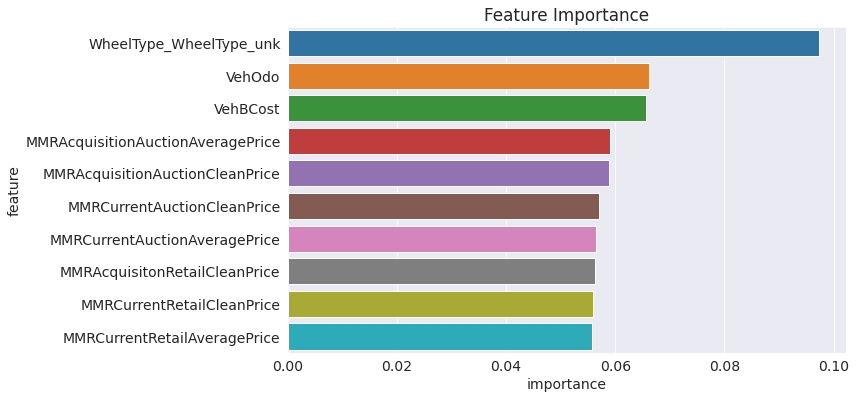

In [89]:
plt.title('Feature Importance')
sns.barplot(data=importance_df.head(10), x='importance', y='feature');

#### Hyperparameter Tuning

In [90]:
def test_params(**params):
    model = RandomForestClassifier(random_state=42, n_jobs=-1, **params).fit(train_inputs, train_targets)
    return model.score(train_inputs, train_targets), model.score(val_inputs, val_targets)

In [91]:
test_params(max_depth=5)

(0.8859820596671356, 0.887865833607366)

In [92]:
test_params(max_depth=26)

(0.9785885233023366, 0.8995944316562534)

In [93]:
test_params(max_depth=35)

(0.9997076931508851, 0.9001973035185794)

In [94]:
test_params(max_depth=50)

(0.9999451924657909, 0.9003617231173956)

In [95]:
test_params(max_leaf_nodes=2**20)

(0.9999086541096516, 0.900087690452702)

In [96]:
base_train_acc = base_model.score(train_inputs, train_targets)
base_val_acc = base_model.score(val_inputs, val_targets)

In [97]:
base_accs = base_train_acc, base_val_acc
base_accs

(0.9999451924657909, 0.899868464320947)

In [98]:
test_params(min_samples_split=100, min_samples_leaf=60)

(0.8991724062334435, 0.8995396251233146)

In [100]:
test_params(min_impurity_decrease=1e-7)

(0.9992875020552825, 0.8998136577880084)

From the above calculation we conclude our hypermeters as follows:
max_depth=50, max_leaf_nodes=2 ** 20, min_samples_split=100, min_samples_leaf=60, min_impurity_decrease=1e-7

In [101]:
model_2 = RandomForestClassifier(n_jobs=-1, 
                               random_state=42, 
                               n_estimators=500,
                               max_depth=50, 
                               max_leaf_nodes=2**20,
                              min_samples_split=100,
                              min_samples_leaf=60,
                              min_impurity_decrease=1e-7)

In [103]:
model_2.fit(train_inputs, train_targets)

RandomForestClassifier(max_depth=50, max_leaf_nodes=1048576,
                       min_impurity_decrease=1e-07, min_samples_leaf=60,
                       min_samples_split=100, n_estimators=500, n_jobs=-1,
                       random_state=42)

In [105]:
model_2.score(train_inputs, train_targets)

0.8989714452746771

The accuracy of our model on training set is 89.89%

In [107]:
model_2.score(val_inputs, val_targets)

0.8997040447221308

The accuracy of our model on validation set is 89.97%,

In [109]:
random_forest_preds=model_2.predict_proba(test_df)
random_forest_preds

array([[0.90205988, 0.09794012],
       [0.91232974, 0.08767026],
       [0.94101343, 0.05898657],
       ...,
       [0.95092772, 0.04907228],
       [0.92641493, 0.07358507],
       [0.91329564, 0.08670436]])

##### Testing our model on test dataset

In [111]:
random_forest_preds = model_2.predict(test_df)

In [112]:
random_forest_preds

array([0, 0, 0, ..., 0, 0, 0])

In [113]:
test_df['IsBadBuy'] = random_forest_preds

/tmp/ipykernel_36/3487530465.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [115]:
test_df['IsBadBuy']

0        0
1        0
2        0
3        0
4        0
        ..
48702    0
48703    0
48704    0
48705    0
48706    0
Name: IsBadBuy, Length: 48707, dtype: int64

In [116]:
jovian.commit()

<IPython.core.display.Javascript object>

[jovian] Updating notebook "aditya-win-official/dontgetkicked" on https://jovian.ai
[jovian] Committed successfully! https://jovian.ai/aditya-win-official/dontgetkicked


'https://jovian.ai/aditya-win-official/dontgetkicked'

I finally conclude that using Random Forest is better as it is more accurate than Logistic Regression Model

### Summary

I have trained two models above, both of which tells you that the car you bought is a good buy or bad buy. My models are Logistic Regression and Random Forest, both of which are totally different from each other. It was a fun activity and I learned a lot from this course and from this exercise

### References

* https://www.kaggle.com/code/balajinagappan/don-t-get-kicked-sklearn-from-scratch
* https://jovian.ai/aditya-win-official/sklearn-decision-trees-random-forests-e743a
* https://jovian.ai/aditya-win-official/python-sklearn-logistic-regression-3c224

In [ ]:
jovian.commit()

<IPython.core.display.Javascript object>